# LAB 2 

* Member 1: Ahmet Ata Ersoy
* Member 2: Yasin Cagatay Duygu

# Overview & Business Understanding 

Data Understanding: 

ChestX-ray dataset comprises 112,120 frontal-view X-ray images of 30,805 unique patients with the text-mined fourteen disease image labels (each image can have multi-labels). An X-ray is produced when a negatively charged electrode is heated by electricity and electrons are released, thereby producing energy. That energy is directed toward a metal plate, or anode, at high velocity and the X-ray is produced when the energy collides with the atoms in the metal plate.

Fourteen common thoracic pathologies include Atelectasis, Consolidation, Infiltration, Pneumothorax, Edema, Emphysema, Fibrosis, Effusion, Pneumonia, Pleural thickening, Cardiomegaly, Nodule, Mass and Hernia. 112,120 frontal-view chest X-ray PNG images in 1024*1024 resolution (RGB). Orientation is almost stable since they are all frontal-view images. Dynamic range is high because of the nature of X-ray images. Also, resizing was needed since 1024*1024 images are computationally expensive. We converted the image to first grayscale to decrease the number of channels and resized the image (256*256). 

We used only one X-ray image from every unique patient. Besides, we included 1050 patient data by including 5 number of thoracic pathologies (Infiltration, Emphysema, Cardiomegaly, Atelectasis, No Finding) since we had limited time for this project and we wanted to decrease the total data size. We selected the given pathologies since they have more distinctive differences than other diseases. This dataset is open-source and can be found in the following links. We tried to guess the pathological condition. 
https://nihcc.app.box.com/v/ChestXray-NIHCC/

This analysis can be used by the administration of the hospitals. We experienced a pandemic in which hospitals reach their capacity. Thus, this analysis is important for hospital’s source utilization. This analysis is also critical to have a faster diagnosis. It is crucial for hospitals and doctors to predict which patients will receive what type of treatment in a short time.  Diagnosis requires a high percentage of success rate. If we cannot achieve this, it can be used for educational purposes.

Our dataset is extracted from the clinical PACS database at National Institutes of Health Clinical Center and consists of approximately 60% of all frontal chest x-rays in the hospital. Therefore, we expect this dataset is significantly more representative to the real patient population distributions and realistic clinical diagnosis challenges, than previous chest x-ray datasets.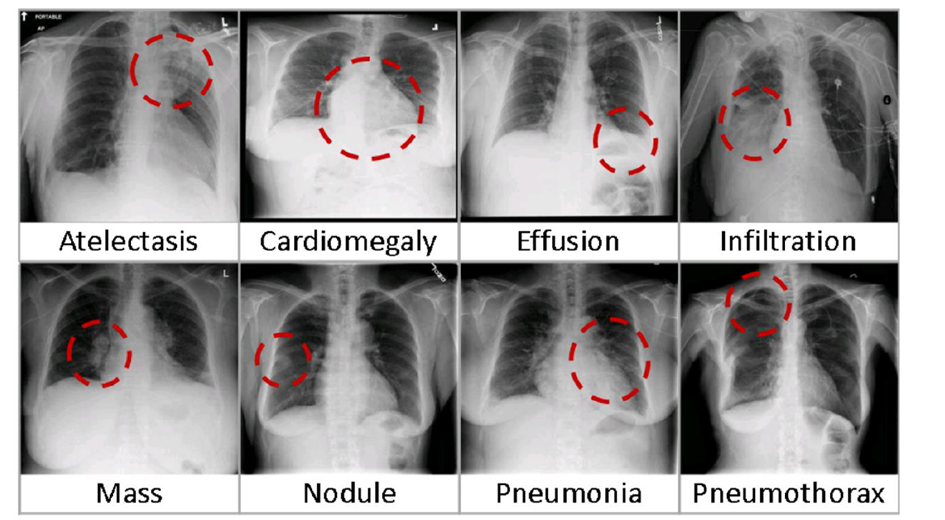

In [ ]:
!pip install opencv-python
#!pip install tensorflow

In [1]:
import os
import pathlib
import numpy as np
import pandas as pd
#import tensorflow as tf
import matplotlib.pyplot as plt
import random
import cv2
#import xgboost as xgb
import pathlib

In [2]:
# reading all data to dataframe df
df = pd.read_csv('Data_Entry_2017_v2020.csv')
df.head()

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImage[Width,Height],OriginalImagePixelSpacing[x,y]
0,00000001_000.png,Cardiomegaly,0,1,57,M,PA,2682,2749,0.143,0.143
1,00000001_001.png,Cardiomegaly|Emphysema,1,1,58,M,PA,2894,2729,0.143,0.143
2,00000001_002.png,Cardiomegaly|Effusion,2,1,58,M,PA,2500,2048,0.168,0.168
3,00000002_000.png,No Finding,0,2,80,M,PA,2500,2048,0.171,0.171
4,00000003_001.png,Hernia,0,3,74,F,PA,2500,2048,0.168,0.168


In [3]:
print('Data set involves variety of combinations of 8 main disease group (image below): ',len(df['Finding Labels'].unique()))
print('We are not going to use all combinations.')

Data set involves variety of combinations of 8 main disease group (image below):  836
We are not going to use all combinations.


### Reads excel sheet containing patient information such as Patient No., Diagnostic Finding (Finding Labels), image file name.

In [19]:
index = []
kcard, knofind, kpn, ke, kata, kin = 0, 0, 0, 0, 0, 0
for i in range(len(df['Finding Labels'])):
    if i == 0: 
        pass
    else:
        if df['Patient ID'][i] == df['Patient ID'][i-1]:
            pass
        elif df['Finding Labels'][i] == 'Cardiomegaly': 
            if kcard < 230:
                index.append(i)   
                kcard = 1 + kcard
                #print(kcard)
            else: 
                pass
        elif df['Finding Labels'][i] == 'No Finding':
            if knofind < 250:
                index.append(i)   
                knofind = 1 + knofind
                #print(knofind)
            else: 
                pass    
        elif df['Finding Labels'][i] == 'Atelectasis':
            if kata < 270:
                index.append(i)   
                kata = 1 + kata
                #print(knofind)
            else: 
                pass            
        elif df['Finding Labels'][i] == 'Infiltration':
            if kin < 250:
                index.append(i)   
                kin = 1 + kin
                #print(knofind)
            else: 
                pass 
        else: pass
len(index), df['Finding Labels'].shape

dl = []
for i in index:
    #print(df.values[i])
    dl.append(df.values[i])
dfp=pd.DataFrame(dl)
print('size of study group after first reduction:', dfp.shape)
dfp = dfp.rename(columns={0:'imageID', 1:'labels', 3:'patientID',
                         4:'Age', 5: 'gender'})
dfp.head()


size of study group after first reduction: (1000, 11)


,imageID,labels,2,patientID,Age,gender,6,7,8,9,10
0,00000002_000.png,No Finding,0,2,80,M,PA,2500,2048,0.171,0.171
1,00000005_000.png,No Finding,0,5,69,F,PA,2048,2500,0.168,0.168
2,00000006_000.png,No Finding,0,6,81,M,PA,2500,2048,0.168,0.168
3,00000007_000.png,No Finding,0,7,82,M,PA,2500,2048,0.168,0.168
4,00000008_000.png,Cardiomegaly,0,8,68,F,PA,2048,2500,0.171,0.171


This is too much for our study and therefore only labels with selected diseases that are not combinations of variety of other diseases: 

Cardiomegaly, Pneumonia, Emphysema, No Finding


This shows how many patient images for analysis we have for the chosen labels (diseases): 


Cardiomegaly, Pneumonia, Emphysema, No Finding

In [20]:
dfp.groupby(['labels'])['labels'].count()

labels
Atelectasis     270
Cardiomegaly    230
Infiltration    250
No Finding      250
Name: labels, dtype: int64

## This part reads the extracted .png file names and saves the files to lists them as image_dataset.

This code tries to saves the files if it exists. Therefore, we have a little less imageset than, the dataframe itself holds. 

In [21]:
import os

Image_ID_Index = dfp.imageID
def find_files(filename, search_path):
    result = []

# Walking top-down from the root
    for root, dir, files in os.walk(search_path):
        if filename in files:
            result.append(os.path.join(root, filename))
    return result

k = 0
images_dataset = [] # images_dataset = dfp.imageID
path = '{0}\images_004'.format('E:\Machine Learning Lab 2\Images')
for i in range(len(Image_ID_Index)):
    try: 
        file=find_files(Image_ID_Index[i], path)
        if file != []:
            images_dataset.append(file)
        else: 
            pass
    except IndexError: 
        pass
print('we have', len(images_dataset),'X-ray images')



1000

## Reads images from images dataset, converts them to grayscale and reshapes them into 1-D np.array.

h, w parameters are how many pixels for height and width. 

Code first reads the images with opencv2 module, turns them into gray-scale and resizes them into h x w. 
X is image feature vectors, 2-D gray-scale image is turned into 1-D vector using reshape function.
X holds feature vectors of all images. 


In [22]:
import os
X = [] 
h, w = 256, 256 
for i in range(len(dfp.imageID)):  
    try:
        #image_data.append(cv2.imread(images_dataset[i][0]).reshape(-1))
        image = cv2.imread(images_dataset[i][0])
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # make grayscale
        gray_resized=cv2.resize(gray, (h,w))
        #print(gray_resized.shape)
        X.append(gray_resized.reshape(-1)) # converting gray image features in feature vector 
        
    except IndexError:
        pass
    
X = np.asarray(X) # Converts X to np.array
print('There are ',X.shape[0],'images. Each image has feature vector with size:', X.shape[1])

There are  1000 images. Each image has feature vector with size: 65536


# PCA Analysis

In [23]:
# this is a scree plot
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })

Wall time: 3.85 s


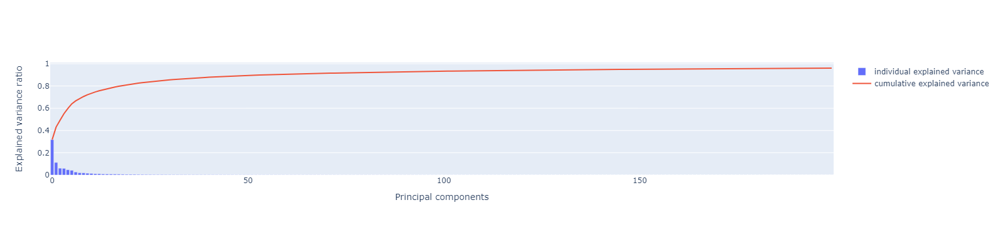

In [25]:
from sklearn.decomposition import PCA

h, w = 256, 256
n_components = 200
#print ("Extracting the top %d eigenfaces from %d images" % (
#    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy()) # X=image_data
#eigenfaces = pca.components_.reshape((n_components, h, w))

plot_explained_variance(pca)

## PCA

First eigenfaces show the most common features. Because of that, they are mostly rounded shapes and they do not include detailed features. This can be seen from the graphs below. 

In [26]:
# a helper plotting function
def plot_gallery(images, titles, h, w, n_row=3, n_col=6):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.7 * n_col, 2.3 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())
        

Wall time: 4.22 s


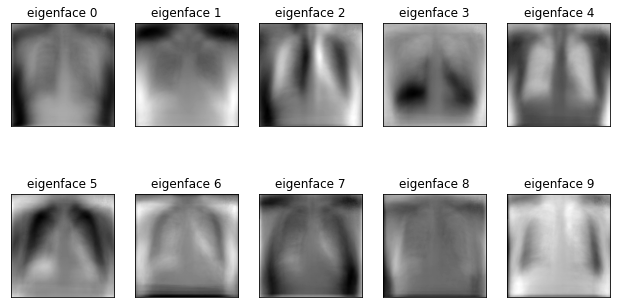

In [28]:
h, w = 256, 256
n_components = 200
#print ("Extracting the top %d eigenfaces from %d faces" % (
#    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenfaces = pca.components_.reshape((n_components, h, w))

eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w,n_row = 2, n_col = 5)

Plot below shows change of explained variance ratio with each addition of PCA component. In our study 200 components was chosen to make sure we are above %95 explained variance ratio. 

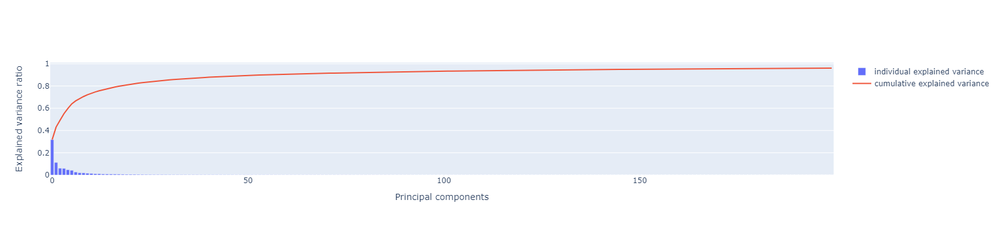

In [29]:
plot_explained_variance(pca)

## Randomized PCA


First eigenfaces show the most common features. Because of that, they are mostly rounded shapes and they do not include detailed features. This can be seen from the graphs below.

Wall time: 4 s


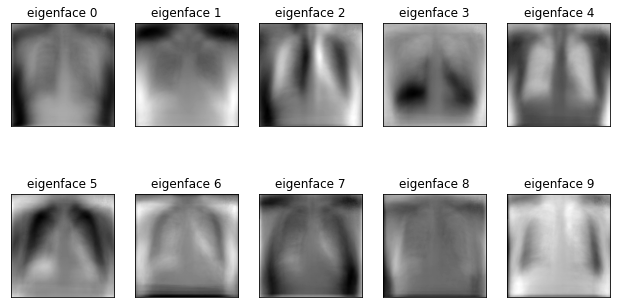

In [30]:
# lets do some PCA of the features and go from 1850 features to 300 features
h, w = 256, 256
n_components = 200
#print ("Extracting the top %d eigenfaces from %d faces" % (
#    n_components, X.shape[0]))

rpca = PCA(n_components=n_components, svd_solver='randomized')
%time rpca.fit(X.copy())
eigenfaces = rpca.components_.reshape((n_components, h, w))

eigenface_titles = ["eigenface %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w,n_row = 2, n_col = 5)

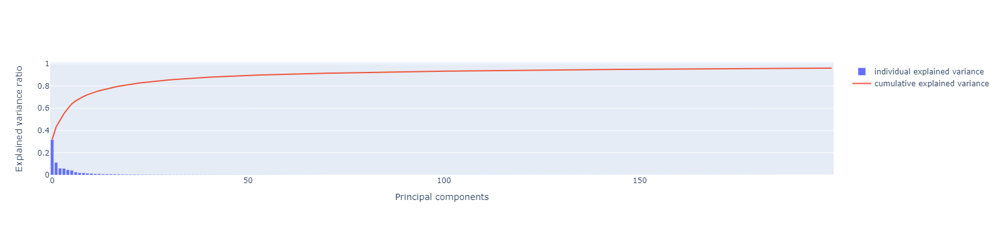

In [31]:
plot_explained_variance(rpca)

## Studying the effect of number of PCA components on explained variance: 

As expected, with the increasing number of principal components, we get a better image construction. Since we use a medical image, it is important to show most features of the original data. Therefore, cut-off point should be high (>95%). 

For future analysis, number of eigenvectors will be selected as 200 (97%)

* We tried capture the computational cost difference between rPCA and PCA. However, we didn't observe any significant difference. It might be due to fact that the number images was not sufficient. This was done due to computational cost considerations. 

* We also didn't observe significant difference of explained variance ratio with increasing component number. The difference was in 0.0001 magnitudes.


PCA runtime with increasing number of components: 
Wall time: 1.22 s
Wall time: 1.33 s
Wall time: 2.15 s
Wall time: 2.42 s
Wall time: 3.94 s
=====
randomized-PCA runtime with increasing number of components: 
Wall time: 1.26 s
Wall time: 1.3 s
Wall time: 2.13 s
Wall time: 2.34 s
Wall time: 4.17 s
=====


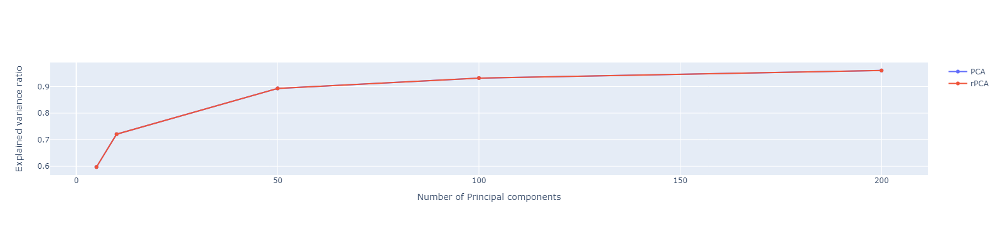

In [32]:
import plotly
from plotly.graph_objs import Bar, Line
from plotly.graph_objs import Scatter, Layout
from plotly.graph_objs.scatter import Marker
from plotly.graph_objs.layout import XAxis, YAxis

print('PCA runtime with increasing number of components: ')
k = []
for i in [5, 10, 50, 100, 200]:
    pca = PCA(n_components=i)
    %time pca.fit(X.copy())
    k.append(np.cumsum(pca.explained_variance_ratio_)[-1])
print('=====')

print('randomized-PCA runtime with increasing number of components: ')
kr = []
for i in [5, 10, 50, 100, 200]:
    rpca = PCA(n_components=i, svd_solver='randomized')
    %time rpca.fit(X.copy())
    kr.append(np.cumsum(rpca.explained_variance_ratio_)[-1])
print('=====')

plotly.offline.iplot({
    "data": [Scatter(y=k, x = [5, 10, 50, 100, 200], name='PCA'), 
             Scatter(y=kr, x = [5, 10, 50, 100, 200], name='rPCA')
        ],
    "layout": Layout(xaxis=XAxis(title='Number of Principal components'), yaxis=YAxis(title='Explained variance ratio'))
})

## Reconstruction of PCA/rPCA images compared with the original image

In [33]:
# widgets example
from ipywidgets import widgets  # make this interactive!

widgets.interact(lambda x: print(x),x=(0,5,1))

import warnings
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)

def plt_reconstruct(idx_to_reconstruct, num_of_components):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    # allowing change of number of PCA components.
    pca = PCA(n_components=num_of_components)
    rpca = PCA(n_components=num_of_components, svd_solver='randomized')
    pca.fit(X.copy())
    rpca.fit(X.copy())
    
    x_flat = X[idx_to_reconstruct].reshape(1, -1)
    reconstructed_image = pca.inverse_transform(pca.transform(x_flat.copy()))    
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(x_flat.copy()))
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,3,1) # original
    plt.imshow(x_flat.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(dfp.labels[idx_to_reconstruct]+f", {x_flat.shape[1]} elements")
    plt.grid(False)
    
    plt.subplot(1,3,2) # pca
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Full PCA, {num_of_components} elements")
    plt.grid(False)
    
    plt.subplot(1,3,3) # randomized pca
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title(f"Randomized PCA, {num_of_components} elements")
    plt.grid(False)
   
n_samples, n_features = X.shape       
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),num_of_components=(0,200,1),__manual=True)

interactive(children=(IntSlider(value=2, description='x', max=5), Output()), _dom_classes=('widget-interact',)…

interactive(children=(IntSlider(value=499, description='idx_to_reconstruct', max=999), IntSlider(value=100, de…

<function __main__.plt_reconstruct(idx_to_reconstruct, num_of_components)>

Above images show that, with 200 elements both rPCA and PCA lacks the ability to capture image details as much as we anticipated, even though; the explained variance ratios were above %95. This might be due to the fact that image details are very important for this kind an analysis.

However, we couldn't increase the number of the principal components because of the computational cost. 

### Reconstructed images with PCA/rPCA

As can be seen, randomized PCA did as much good job as the full PCA. As can be seen from the graph, we almost got the same reconstruction, visually. Therefore, a randomized PCA can be selected over full PCA considering computational cost even if we couldn't observe the impact with our component and data size. 

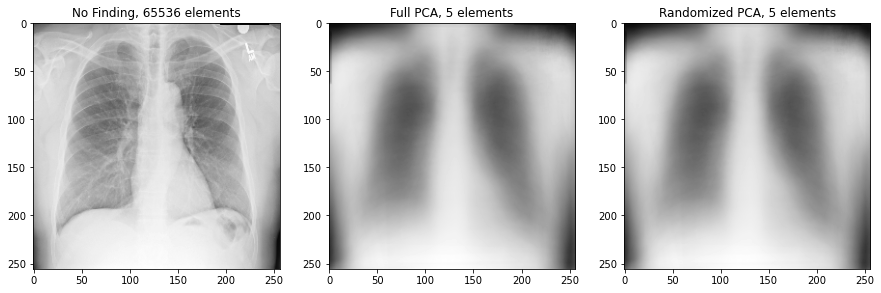

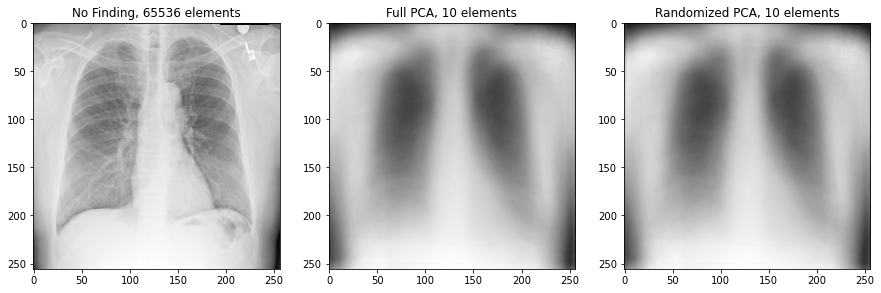

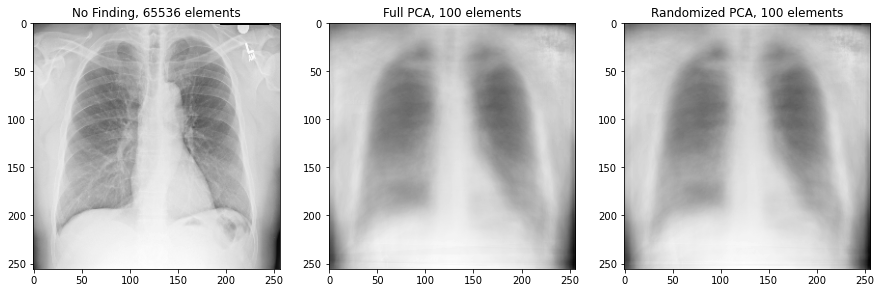

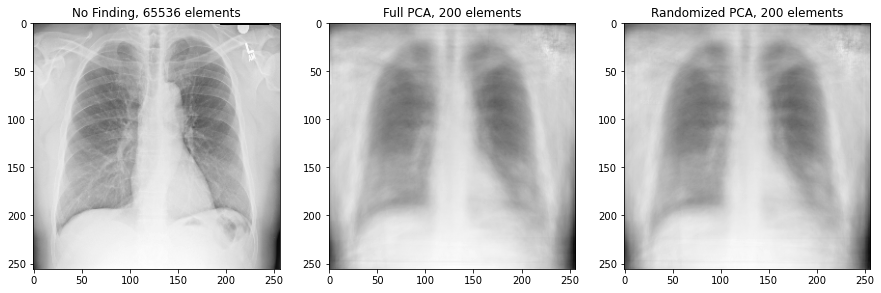

In [34]:
for k in [5,10,100,200]:
    plt_reconstruct(100,k)

# PCA For Image Classification

In [35]:
from ipywidgets import fixed
import copy

from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features

# RPCA bakiyor.
X_pca_features = rpca.transform(copy.deepcopy(X))
dist_matrix_pca = pairwise_distances(copy.deepcopy(X_pca_features),
                                     metric="seuclidean")

# put it together inside a nice widget
def closest_image(dmat_pca, idx1):
    
    # NOTE: this will NOT suffice for evaluation of a nearest neighbor classifier for your lab assignment
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image distances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances) #pca
    
    distances[idx2] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances) # pixels
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    plt.imshow(X[idx1].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Original:"+dfp.labels[idx1])
    plt.grid(False)

    plt.subplot(1,3,2)
    plt.imshow(X[idx2].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Closest:"+dfp.labels[idx2])
    plt.grid(False)
    
    plt.subplot(1,3,3)
    plt.imshow(X[idx3].reshape((h,w)),cmap=plt.cm.gray)
    plt.title("Next Closest:"+dfp.labels[idx3])
    plt.grid(False)
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

interactive(children=(IntSlider(value=499, description='idx1', max=999), Output()), _dom_classes=('widget-inte…

<function __main__.closest_image(dmat_pca, idx1)>

### Success rate

In [36]:
correct = 0
for idx1 in range(len(images_dataset)):
    distances = copy.deepcopy(dist_matrix_pca[idx1,:]) # dist_matrix = dmat_pca
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    if dfp.labels[idx1] == dfp.labels[idx2]: 
        correct = correct + 1
    else:
        pass
success_rate_daisy = correct/len(images_dataset)
print('PCA success rate is: ', success_rate_daisy)
    

PCA success rate is:  0.301


This indicates that our diagnosis model, succeeds to diagniose correctly with 30.1% success rate.

# DAISY

The DAISY descriptor is an algorithm that converts local image regions into low dimensional invariant descriptors which can be used for matching and classification. It can be applied densely or applied to patches extracted around interest points.

We selected DAISY since it focuses on gradient (derivative). We have differences in the picture in certain locations changing with the pathological status. DAISY does not focus as overall image but looks at the derivatives. Thus, we thought that it would be better to choose DAISY over the other algorithms to test.

* With the chosen Daisy parameters, daisy descriptors visually looks like below

(3, 3, 68) 612 (256, 256, 3)


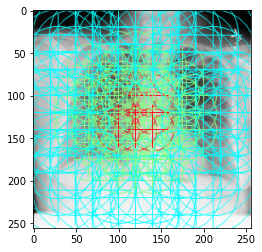

In [37]:

from skimage.feature import daisy

# lets first visualize what the daisy descriptor looks like
image = cv2.imread(images_dataset[1][0])
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray_resized=cv2.resize(gray, (h,w))
features, img_desc = daisy(gray_resized, 
                           step=20, 
                           radius=100, 
                           rings=2, 
                           histograms=8, 
                           orientations=4, 
                           visualize=True,
                           normalization = 'daisy')
plt.imshow(img_desc)
plt.grid(False)
print(features.shape, features.shape[0]*features.shape[1]*features.shape[2], img_desc.shape)

In [38]:
# create a function to take in the row of the matrix and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape), step=20, radius=100, 
                 rings=2, histograms=8, orientations=4, 
                 visualize=False)
    return feat.reshape((-1))

# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

Wall time: 3min 18s
(1000, 612)


In [39]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)

Wall time: 21.3 ms


## Closest with DAISY

675


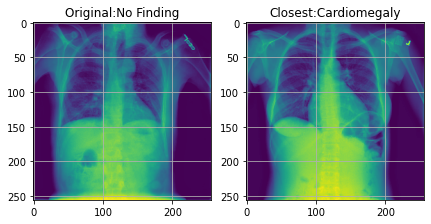

In [40]:
import copy
# find closest image to current image
idx1 = 53 #8, 17, 20, 25, 26 cardi

distances = copy.deepcopy(dist_matrix[idx1,:]) # dist_matrix = dmat_pca
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)
print(idx2)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
plt.imshow(X[idx1].reshape((h,w)))
plt.title("Original:"+dfp.labels[idx1])
plt.grid()

plt.subplot(1,2,2)
plt.imshow(X[idx2].reshape((h,w)))
#plt.title("Closest Image")
plt.title("Closest:"+dfp.labels[idx2])
plt.grid()

### Daisy's success rate

In [41]:
correct = 0
for idx1 in range(len(images_dataset)):
    distances = copy.deepcopy(dist_matrix[idx1,:]) # dist_matrix = dmat_pca
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    if dfp.labels[idx1] == dfp.labels[idx2]: 
        correct = correct + 1
    else:
        pass
success_rate_daisy = correct/len(images_dataset)
print('Daisy success rate is: ', success_rate_daisy)
    
    

Daisy success rate is:  0.351


This indicates that our diagnosis model, succeeds to diagniose correctly with 35.1% success rate.

### PCA / Daisy diagnostic success rate discussion

* Daisy has shown %5 higher success rate compared to PCA algorithm. We expected this since DAISY algorithm uses gradients and has a more geometrical approach which seems to be more suitable for a dataset like ours. 

* PCA and rPCA looks at the principal components. Because of that, they focus on common features first. Top principal components do not represent the detailed features. However, we need the detailed features for this project. By looking at selected images by DAISY and PCA, we can say that the algorithms do a pretty good job selecting the most similar X-Ray image. However, they are not successful at focusing on the small details we wanted to see. To guess the pathological condition, it is not important if shoulders, rib cage boundaries or body size is similar to each other. However, algorithms also focus on that. 

In [42]:
from ipywidgets import fixed
# put it together inside a nice widget
def closest_image(dmat_daisy, dmat_pca, idx1):
    # NOTE: this will not suffice for evaluation 
    # of a nearest neighbor classifier for your lab assignment
    # do not use this code for satifying the lab assignment requirement
    
    distances = copy.deepcopy(dmat_daisy[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances = copy.deepcopy(dmat_pca[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    plt.imshow(X[idx1].reshape((h,w)))
    plt.title("Original:"+dfp.labels[idx1])
    plt.grid()

    plt.subplot(1,3,2)
    plt.imshow(X[idx2].reshape((h,w)))
    plt.title("DAISY Closest:"+dfp.labels[idx2])
    plt.grid()
    
    plt.subplot(1,3,3)
    plt.imshow(X[idx3].reshape((h,w)))
    plt.title("PCA Closest:"+dfp.labels[idx3])
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),
                 dmat_daisy=fixed(dist_matrix),
                 dmat_pca=fixed(dist_matrix_pca),
                 __manual=True)

interactive(children=(IntSlider(value=499, description='idx1', max=999), Output()), _dom_classes=('widget-inte…

<function __main__.closest_image(dmat_daisy, dmat_pca, idx1)>

## Keypoint Matching 

DAISY uses circular grids instead of rectangular, and it shows that this kind of structure has better localization properties than rectangular ones [1]. 
What is more, DAISY is able to resist rotational perturbations naturally for its combining isotropic Gaussian kernels with circular grids. Such original DAISY descriptor algorithm, however, cannot handle somewhat large in-plane rotation, and performs even worse in the situation of significant rotational changes. [2] 
Guo et al. suggested a method to use key point matching with DAISY. Harris corner detector is used to find key point matching 
We used ORB Detector and Brute Force Matcher for the Key Point Matching [3]
Code overview:
* Load the images using imread() function and pass the path or name of the image as a parameter.
* Create the ORB detector for detecting the features of the images.
* Using the ORB detector find the keypoints and descriptors for both of the images.
* After detecting the features of the images. Now write the Brute Force Matcher for matching the features of the images and stored it in the variable named as “brute_force“.
* For matching we are using the brute_force.match() and pass the descriptors of first image and descriptors of the second image as a parameter.
* After finding the matches we have to sort that matches according to the humming distance between the matches, less will be the humming distance better will be the accuracy of the matches.
* After sorting according to humming distance we have to draw the feature matches for that we use drawMatches() function in which pass first image and keypoints of first image, second image and keypoints of second image and the best_matches as a parameter and stored it in the variable named as “output_image“.
* After drawing the feature matches we have to see the matches for that we use imshow() function pass the window name and output_image.
* Write the waitkey() function and write the destroyAllWindows() for destroying all the windows.

Oriented Fast and Rotated Brief (ORB) Detector:

ORB detector stands for Oriented Fast and Rotated Brief, this is free of cost algorithm, the benefit of this algorithm is that it does not require GPU it can compute on normal CPU.

ORB is basically the combination of two algorithms involved FAST and BRIEF where FAST stands for Features from Accelerated Segments Test whereas BRIEF stands for Binary Robust Independent Elementary Features.
ORB detector first uses FAST algorithm, this FAST algorithm finds the key points then applies Harries corner measure to find top N numbers of key points among them, this algorithm quickly selects the key points by comparing the distinctive regions like the intensity variations.

This algorithm works on Key point matching, Key point is distinctive regions in an image like the intensity variations.
Now the role of BRIEF algorithm comes, this algorithm takes the key points and turn into the binary descriptor/binary feature vector that contains the combination of 0s and1s only. 
The key points founded by FAST algorithm and Descriptors created by BRIEF algorithm both together represent the object. BRIEF is the faster method for feature descriptor calculation and it also provides a high recognition rate until and unless there is large in-plane rotation.

Brute Force Matcher:

Brute Force Matcher is used for matching the features of the first image with another image. It takes one descriptor of first image and matches to all the descriptors of the second image and then it goes to the second descriptor of first image and matches to all the descriptor of the second image and so on.



In [43]:
# importing openCV library
import cv2
 
# function to read the images by taking there path
def read_image(path1,path2):
    read_img1 = cv2.imread(path1)
    read_img2 = cv2.imread(path2)
    return (read_img1,read_img2)
 
# function to convert images from RGB to gray scale
def convert_to_grayscale(pic1,pic2):
    gray_img1 = cv2.cvtColor(pic1,cv2.COLOR_BGR2GRAY)
    gray_img2 = cv2.cvtColor(pic2,cv2.COLOR_BGR2GRAY)
    return (gray_img1,gray_img2)
 
# function to detect the features by finding key points
# and descriptors from the image
def detector(image1,image2):
    # creating ORB detector
    detect = cv2.ORB_create()
 
    # finding key points and descriptors of both images using
    # detectAndCompute() function
    key_point1,descrip1 = detect.detectAndCompute(image1,None)
    key_point2,descrip2 = detect.detectAndCompute(image2,None)
    return (key_point1,descrip1,key_point2,descrip2)
 
# function to find best detected features using brute force
# matcher and match them according to there humming distance
def BF_FeatureMatcher(des1,des2):
    brute_force = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck=True)
    no_of_matches = brute_force.match(des1,des2)
 
    # finding the humming distance of the matches and sorting them
    no_of_matches = sorted(no_of_matches,key=lambda x:x.distance)
    return no_of_matches
 
# function displaying the output image with the feature matching
def display_output(pic1,kpt1,pic2,kpt2,best_match):
 
    # drawing the feature matches using drawMatches() function
    output_image = cv2.drawMatches(pic1,kpt1,pic2,kpt2,best_match,None,flags=2)
    cv2.imshow('Output image',output_image)

In [51]:
def closest_image_w_keymatching(img, idx1):
    image = cv2.imread(img[idx1][0])
    gray_pic1 = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    percentage_success = []
    for idx2 in range(len(img)):
        if idx2 == idx1: 
            tot_feature_matches = 0 
        else:
            image = cv2.imread(img[idx2][0])
            gray_pic2 = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
            key_pt1,descrip1,key_pt2,descrip2 = detector(gray_pic1,gray_pic2)
            # sorting the number of best matches obtained from brute force matcher
            number_of_matches = BF_FeatureMatcher(descrip1,descrip2)
            tot_feature_matches = len(number_of_matches) 
            # printing total number of feature matches found
            #print(f'Total Number of Features matches found are {tot_feature_matches}')
        percentage_success.append(tot_feature_matches/min(len(descrip1),len(descrip2)))
        
    idx2 = percentage_success.index(max(percentage_success)) 
    #print('maximum percentage match was foud with image no.',idx2)
    #print('flag1')  
    key_pt1,descrip1,key_pt2,descrip2 = detector(gray_pic1,gray_pic2)
    number_of_matches = BF_FeatureMatcher(descrip1,descrip2)
    output_image = cv2.drawMatches(gray_pic1,key_pt1,gray_pic2,key_pt2,number_of_matches,None,flags=2)
    return idx2
    


In [ ]:
# based on chosen image (idx1), this function matches the keypoints and returns the 
# image index (idx2) with the highest match percentage.
idx1 = 3 # choose the index of the image 
image = cv2.imread(images_dataset[idx1][0])
gray_pic1 = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
idx2 = closest_image_w_keymatching(images_dataset,idx1 = idx1)
image = cv2.imread(images_dataset[idx2][0])
gray_pic2 = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
key_pt1,descrip1,key_pt2,descrip2 = detector(gray_pic1,gray_pic2)
number_of_matches = BF_FeatureMatcher(descrip1,descrip2) # Brute Force Feature Matcher
output_image = cv2.drawMatches(gray_pic1,key_pt1,gray_pic2,key_pt2,number_of_matches,None,flags=2)
cv2.imshow('Output image',output_image)
cv2.waitKey()

The output of the cv2.imshow opens an external window to show the image output. It shows two matching images and connects them with by their keypoints. The runtime can be very high. 

* This key point matching algorithm identifies keypoints at distinct features. Because some images have markers on them or some patients have accessories that shows very intensely in X-ray (belt etc.). These features creates pseduo-key points that decreases the reliability of this algorithm for our dataset.

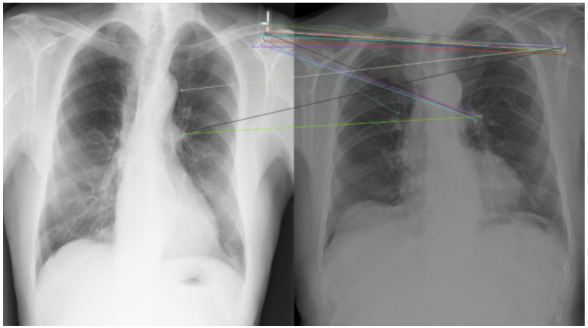

# References

[1] K. Mikolajczyk, C. Schmid. A Performance Evaluation of Local Descriptors. IEEE Transactions        on Pattern Analysis and Machine Intelligence, 27(10), 2005.


[2] Y. Guo, Z. -C. Mu, H. Zeng and K. Wang, "Fast Rotation-Invariant DAISY Descriptor for Image Keypoint Matching," 2010 IEEE International Symposium on Multimedia, 2010, pp. 183-190, doi: 10.1109/ISM.2010.34.


[3] Feature matching using brute force in opencv. GeeksforGeeks. (2021, August 10). Retrieved September 29, 2022, from https://www.geeksforgeeks.org/feature-matching-using-brute-force-in-opencv/
